In [ ]:

# Sinkronisasi loader data dengan app.py
import pandas as pd
from pathlib import Path

BASE_DIR = Path.cwd()
# Jika notebook dijalankan di Colab, sesuaikan path: upload folder yang sama ke /content
if (BASE_DIR / "dataset").exists():
    pass
elif Path("/content/dataset").exists():
    BASE_DIR = Path("/content")

DAY_CSV  = BASE_DIR / "dataset" / "day.csv"
HOUR_CSV = BASE_DIR / "dataset" / "hour.csv"

day  = pd.read_csv(DAY_CSV)
hour = pd.read_csv(HOUR_CSV)

day['dteday']  = pd.to_datetime(day['dteday'])
hour['dteday'] = pd.to_datetime(hour['dteday'])

print("Loaded:", DAY_CSV, HOUR_CSV)


# Proyek Analisis Data: Bike Sharing
**Nama:** Muhamad Akrom Raihan  
**Email:** akromraihanakrom@gmail.com  
**ID Dicoding:** B25B9D035

## Menentukan Pertanyaan Bisnis
1. **Apakah ada pengaruh antara musim, hari kerja, dan kondisi cuaca terhadap jumlah peminjaman sepeda?**
2. **Pada pukul berapa peminjaman sepeda yang paling ramai dan paling sepi, serta perbedaannya antara hari kerja vs akhir pekan?**

## Import Semua Packages/Library yang Digunakan

In [86]:

#library-library yang digunakan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#Saat nampilin data frame, nanti pandas bakalan show semua kolom, soalnya kayanya kalau engga bajak muncul sebagian
pd.set_option('display.max_columns', None)

#Bikin ukuran grafik nanti lebar sama tingginya itu 10 & 5
plt.rcParams['figure.figsize'] = (10,5)


## Data Wrangling

### Gathering Data


In [87]:

# Dataset yang dipakai itu Bike Sharing (Capital Bikeshare 2011–2012)  pake file day.csv dan hour.csv (per jam)
import glob
glob.glob(dataset_path('day.csv')), glob.glob(dataset_path('hour.csv'))


(['dataset/day.csv'], ['dataset/hour.csv'])

**Insight:** Pas diliat pakai excel, ada kolom musim cuaca dan waktu, bisa diolah datanya dengan perbantingan musim cuaca dan waktu dengan quantity peminjaman sepeda

### Accessing Data

In [88]:

day = pd.read_csv(dataset_path('day.csv'))
hour = pd.read_csv(dataset_path('hour.csv'))




In [89]:
#Buat munculin semua data yang ada di excel day (jadi ga cuma sebagian) (731 halaman)
from google.colab import data_table
data_table.enable_dataframe_formatter()
day

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


In [90]:
#Buat munculin semua data yang ada di excel day (jadi ga cuma sebagian) (17379 halaman)
from google.colab import data_table
data_table.enable_dataframe_formatter()
hour

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


**Insight:** Ditampilin semua data biar buat liat sama make sure data gaharus ke excel dulu.

### Assessing Data

In [91]:

#Nampilin data dan kolom dataset excelnya
print("Ukuran data:", "day", day.shape, "| hour", hour.shape)

#Nampilin tipe data dataset excelnya
print("\nTipe data:"); display(day.dtypes); display(hour.dtypes)

#Nampilin missing value yang ada di dataset excelnya
print("\nMissing values:"); display(day.isna().sum()); display(hour.isna().sum())

#Nampilin berapa duplikasi yang ada di excelnya
print("\nDuplikasi:"); print("day:", day.duplicated().sum(), "| hour:", hour.duplicated().sum())

#Nampilin statistik deskriptif dataset excelnya
print("\nRingkasan cnt:"); display(day['cnt'].describe()); display(hour['cnt'].describe())


Ukuran data: day (731, 16) | hour (17379, 17)

Tipe data:


,0
instant,int64
dteday,object
season,int64
yr,int64
mnth,int64
holiday,int64
weekday,int64
workingday,int64
weathersit,int64
temp,float64


,0
instant,int64
dteday,object
season,int64
yr,int64
mnth,int64
hr,int64
holiday,int64
weekday,int64
workingday,int64
weathersit,int64



Missing values:


,0
instant,0
dteday,0
season,0
yr,0
mnth,0
holiday,0
weekday,0
workingday,0
weathersit,0
temp,0


,0
instant,0
dteday,0
season,0
yr,0
mnth,0
hr,0
holiday,0
weekday,0
workingday,0
weathersit,0



Duplikasi:
day: 0 | hour: 0

Ringkasan cnt:


,cnt
count,731.000000
mean,4504.348837
std,1937.211452
min,22.000000
25%,3152.000000
50%,4548.000000
75%,5956.000000
max,8714.000000


,cnt
count,17379.000000
mean,189.463088
std,181.387599
min,1.000000
25%,40.000000
50%,142.000000
75%,281.000000
max,977.000000


**Insight:** Data set day ada 731 baris dan 16 kolom, kalo hour ada 17379 baris dan 17 kolom. Duplikasi sama missingnya ada 0 berarti gaada data yang hilang atau terduplikat. Udah siap buat di eda, gaperlu cleaning data.

### Cleaning Data

**Insight:**

## Exploratory Data Analysis (EDA)

In [92]:

#dataset day : Buat tahu hubungan setiap harinya antara cnt (penggunaan sepeda) terhadap parameter lainnya (semakin ke 1 hubungan dengan penggunaaan sepeda pengaruh kuat kalau -1 pengaruhnya terbalik kalau 0 tidak ada hubungan)
import numpy as np
numeric_cols = day.select_dtypes(include=[np.number]).columns
corr = day[numeric_cols].corr()['cnt'].sort_values(ascending=False).head(10)
corr


,cnt
cnt,1.000000
registered,0.945517
casual,0.672804
atemp,0.631066
instant,0.628830
temp,0.627494
yr,0.566710
season,0.406100
mnth,0.279977
weekday,0.067443


In [93]:
#dataset hour : Buat tahu hubungan setiap jamnya antara cnt (penggunaan sepeda) terhadap parameter lainnya (semakin ke 1 hubungan dengan penggunaaan sepeda pengaruh kuat kalau -1 pengaruhnya terbalik kalau 0 tidak ada hubungan)
import numpy as np
numeric_cols = hour.select_dtypes(include=[np.number]).columns
corr = hour[numeric_cols].corr()['cnt'].sort_values(ascending=False).head(10)
corr

,cnt
cnt,1.000000
registered,0.972151
casual,0.694564
temp,0.404772
atemp,0.400929
hr,0.394071
instant,0.278379
yr,0.250495
season,0.178056
mnth,0.120638


**Insight:**
- Mayoritas permintaan sepeda berasal dari pengguna terdaftar dibandignkan dengan yang casual.
- Peminjaman sepeda meningkat pada cuaca yang nyaman (clear/cerah lebih banyak dibanding hujan dan salju)
- Peminjaman sepeda 2011 ke 2012 terlihat ada peningkatan
- Faktor musim berpengaruh lumayan sedang, tetapi hari kerja vs akhir pekan tidak terlalu memberi dampak (kemungkinan karena pas hari kerja dipakai buat bekerja saat akhir pekan dipakai buat olahraga.
- Aktivitas penyewaan cenderung meningkat pada jam berangkat kerja  dan jam pulang kerja.

## Visualization & Explanatory Analysis
### Pertanyaan 1 : Apakah ada pengaruh antara musim, hari kerja, dan kondisi cuaca terhadap jumlah peminjaman sepeda?

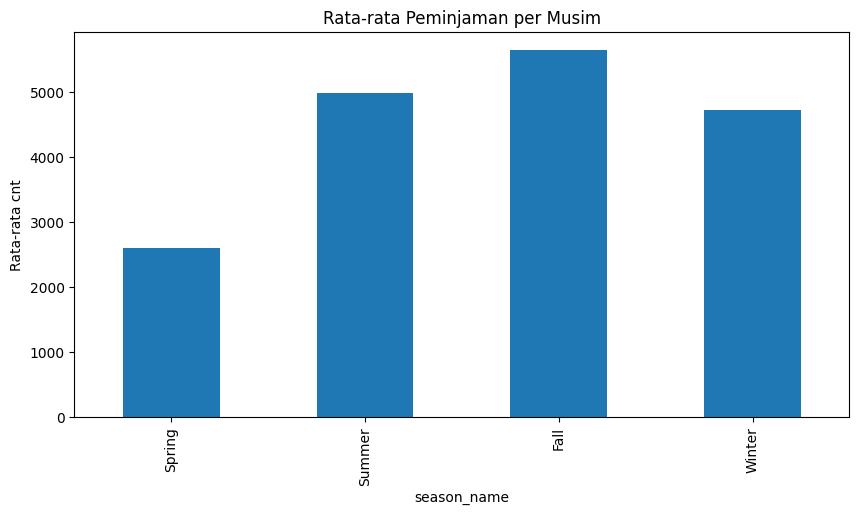

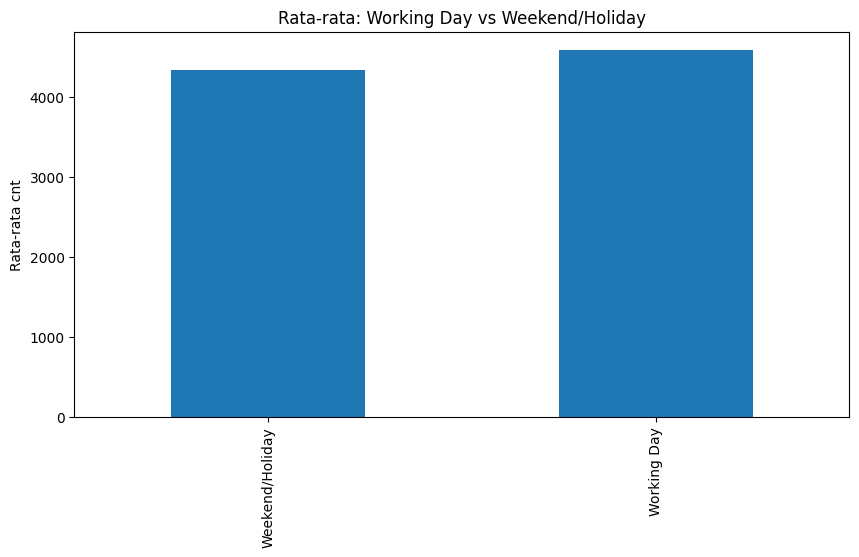

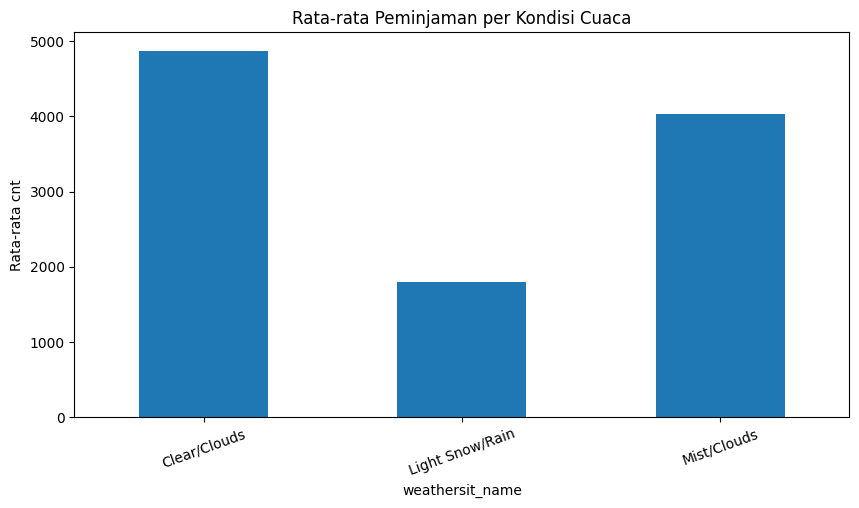

In [94]:

#Convert dr parameter yang menggunakan angka menjadi teks kaya yg dijelasin di kaggle
day['dteday'] = pd.to_datetime(day['dteday'])
hour['dteday'] = pd.to_datetime(hour['dteday'])
day['weekday_name'] = day['weekday'].map({0:'Sun',1:'Mon',2:'Tue',3:'Wed',4:'Thu',5:'Fri',6:'Sat'})
day['season_name'] = day['season'].map({1:'Spring',2:'Summer',3:'Fall',4:'Winter'})
day['weathersit_name'] = day['weathersit'].map({1:'Clear/Clouds',2:'Mist/Clouds',3:'Light Snow/Rain',4:'Heavy'})
hour['weekday_name'] = hour['weekday'].map({0:'Sun',1:'Mon',2:'Tue',3:'Wed',4:'Thu',5:'Fri',6:'Sat'})
hour['workingday_name'] = hour['workingday'].map({0:'Weekend/Holiday',1:'Working Day'})

#Bikin grafik
season_avg = day.groupby('season_name')['cnt'].mean().reindex(['Spring','Summer','Fall','Winter'])
season_avg.plot(kind='bar', title='Rata-rata Peminjaman per Musim'); plt.ylabel('Rata-rata cnt'); plt.show()

wd_avg = day.groupby('workingday')['cnt'].mean().rename({0:'Weekend/Holiday',1:'Working Day'})
wd_avg.index = ['Weekend/Holiday','Working Day']
wd_avg.plot(kind='bar', title='Rata-rata: Working Day vs Weekend/Holiday'); plt.ylabel('Rata-rata cnt'); plt.show()

weather_avg = day.groupby('weathersit_name')['cnt'].mean()
weather_avg.plot(kind='bar', title='Rata-rata Peminjaman per Kondisi Cuaca'); plt.ylabel('Rata-rata cnt'); plt.xticks(rotation=20); plt.show()


**Insight Q1:** Berpengaruh, musim Fall musim tertinggi peminjman sepeda, working day lebih tinggi dr weekend; pas cuaca cerah meningkatkan peminjaman sepepeda.

### Pertanyaan 2 : Pada pukul berapa peminjaman sepeda yang paling ramai dan paling sepi, serta perbedaannya antara hari kerja vs akhir pekan?

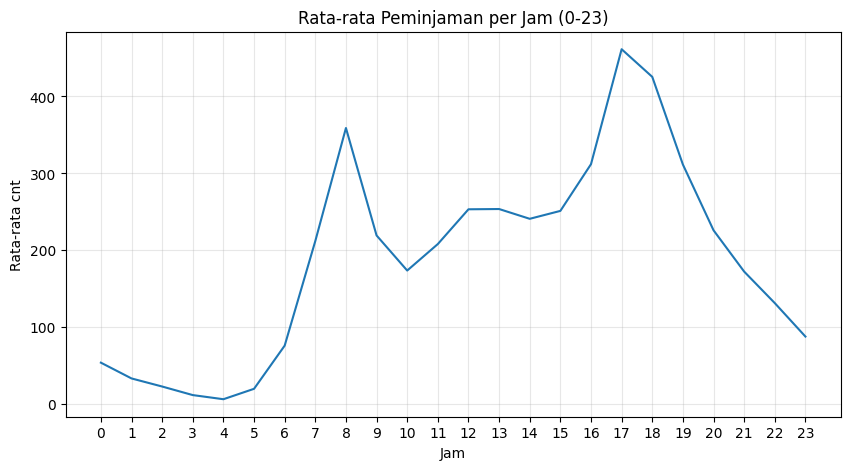

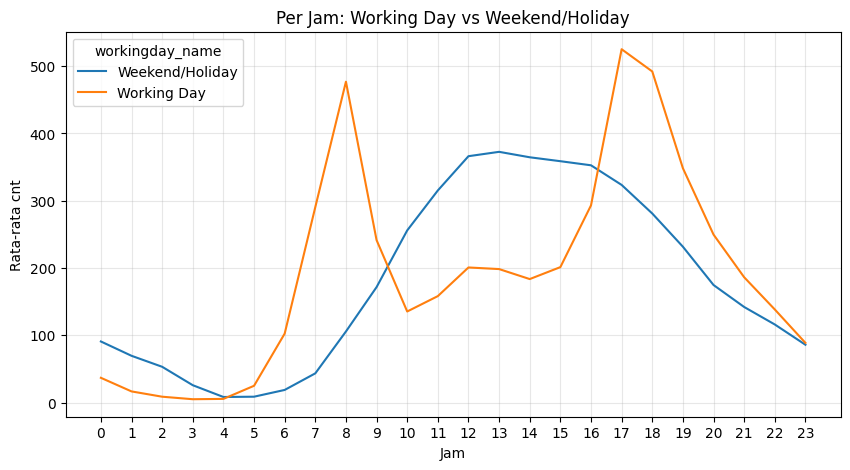

Jam tersibuk: 17:00 | Jam tersepi: 4:00


In [95]:

hourly_avg = hour.groupby('hr')['cnt'].mean()
hourly_avg.plot(title='Rata-rata Peminjaman per Jam (0-23)'); plt.xlabel('Jam'); plt.ylabel('Rata-rata cnt'); plt.xticks(range(0,24,1)); plt.grid(True, alpha=0.3); plt.show()

pivot = hour.pivot_table(index='hr', columns='workingday_name', values='cnt', aggfunc='mean')
pivot.plot(title='Per Jam: Working Day vs Weekend/Holiday'); plt.xlabel('Jam'); plt.ylabel('Rata-rata cnt'); plt.xticks(range(0,24,1)); plt.grid(True, alpha=0.3); plt.show()

peak_hour = int(hourly_avg.idxmax()); low_hour = int(hourly_avg.idxmin())
print(f'Jam tersibuk: {peak_hour}:00 | Jam tersepi: {low_hour}:00')


**Insight Q2:**
- Pada working day peminjaman sepeda terbanyak pada jam 8 pagi 17 sore (pas dengan waktu orang kerja berangkat dan pulang) dan paling dikit pada jam 3 sampai jam 4 pagi.
- Pada weekend day peminjaman sepeda terbanyak pada jam 13 siang dan paling dikit pada jam 4 sampa jam 5 pagi

## Analisis Lanjutan (Opsional)

## Conclusion

- Conclution pertanyaan 1 : Apakah ada pengaruh antara musim, hari kerja, dan kondisi cuaca terhadap jumlah peminjaman sepeda?

Pengaruh, Faktor cuaca memiliki pengaruh penting terhadap tingkat penggunaan sepeda. Kondisi suhu yang nyaman (baik temp maupun atemp) cenderung meningkatkan jumlah penyewaan. Dengan kata lain, semakin baik atau hangat cuaca, semakin tinggi minat masyarakat untuk menggunakan sepeda. Lalu pada musim panas dan musim gugur menunjukkan aktivitas penyewaan yang lebih tinggi dibanding musim semi dan musim dingin. Masyarakat lebih suka meminjam sepeda pada workday dibanding weekday/holiday, walaupun tidak selisih signifikan.

- Conclution pertanyaan 2 : Pada pukul berapa peminjaman sepeda yang paling ramai dan paling sepi, serta perbedaannya antara hari kerja vs akhir pekan?

Pada working day, terdapat jam-jam sibuk peminjaman sepeda, khususnya pada 07.00–09.00 dan 17.00–19.00 yang tinggi peminjaman, yang berkaitan dengan aktivitas berangkat dan pulang kerja, dan cenderung rendah pada dini hari dan malam hari, sedangkan pada weekdayholiday, peminjaman sepeda cenderung tinggi dari siang sampai malam hari, dan cenderung rendah pada pagi dan malam hari.